# Загрузка данных

In [2]:
# Скачиваем Stanford Dogs Dataset
!wget -O images.tar http://vision.stanford.edu/aditya86/ImageNetDogs/images.tar
!wget -O annotation.tar http://vision.stanford.edu/aditya86/ImageNetDogs/annotation.tar

# Распаковываем
!tar -xf images.tar
!tar -xf annotation.tar

print("Датасет загружен!")

--2025-12-27 09:59:08--  http://vision.stanford.edu/aditya86/ImageNetDogs/images.tar
Resolving vision.stanford.edu (vision.stanford.edu)... 171.64.68.10
Connecting to vision.stanford.edu (vision.stanford.edu)|171.64.68.10|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 793579520 (757M) [application/x-tar]
Saving to: ‘images.tar’

images.tar          100%[===================>] 756.82M  21.1MB/s    in 38s     

2025-12-27 09:59:46 (19.8 MB/s) - ‘images.tar’ saved [793579520/793579520]

--2025-12-27 09:59:46--  http://vision.stanford.edu/aditya86/ImageNetDogs/annotation.tar
Resolving vision.stanford.edu (vision.stanford.edu)... 171.64.68.10
Connecting to vision.stanford.edu (vision.stanford.edu)|171.64.68.10|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 21852160 (21M) [application/x-tar]
Saving to: ‘annotation.tar’

annotation.tar      100%[===================>]  20.84M  19.4MB/s    in 1.1s    

2025-12-27 09:59:48 (19.4 MB/s) - ‘annotat

# Примеры изображений

In [2]:
# В каждой папке хранится отдельная порода
!ls Images | head -5

n02085620-Chihuahua
n02085782-Japanese_spaniel
n02085936-Maltese_dog
n02086079-Pekinese
n02086240-Shih-Tzu


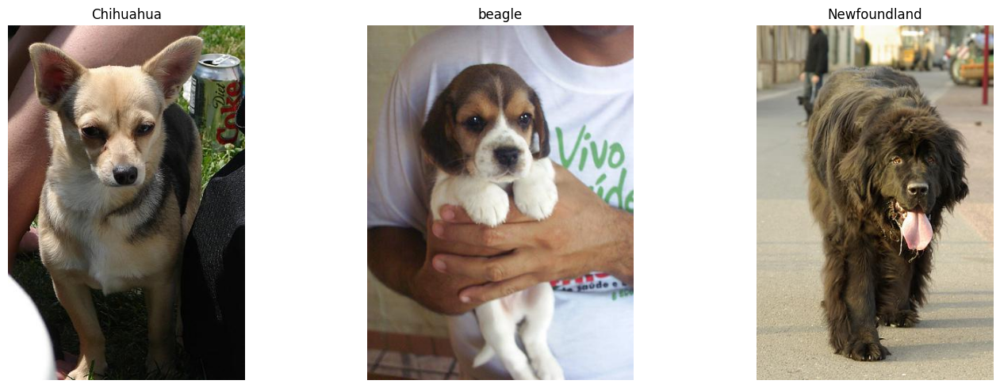

In [3]:
from PIL import Image
import matplotlib.pyplot as plt

# Список путей к изображениям
image_paths = [
    "/content/Images/n02085620-Chihuahua/n02085620_10074.jpg",
    "/content/Images/n02088364-beagle/n02088364_10108.jpg",
    "/content/Images/n02111277-Newfoundland/n02111277_10160.jpg"
]

# Настраиваем фигуру: 1 ряд, 3 колонки
fig, axes = plt.subplots(1, len(image_paths), figsize=(15, 5))

# Отключаем оси и показываем каждое изображение
for ax, img_path in zip(axes, image_paths):
    img = Image.open(img_path)
    ax.imshow(img)
    ax.axis('off')
    # Подпись с названием породы
    breed = img_path.split("/")[-2].split("-", 1)[1]
    ax.set_title(breed, fontsize=12)

plt.tight_layout()
plt.show()

# Детекция

In [3]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 26.4 MB/s eta 0:00:00


In [4]:
import os
import random
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO
from pathlib import Path

# === 1. Загружаем модель ===
print("Загружаем YOLOv8...")
model = YOLO("yolov8s.pt")
# model(str(img_path), conf=0.1)

# === 2. Собираем список всех фото ===
image_dir = Path("Images")
all_images = list(image_dir.rglob("*.jpg"))
print(f"Найдено {len(all_images)} изображений")

# Выбираем случайные 50
random.seed(42)
test_images = random.sample(all_images, min(50, len(all_images)))
print(f"Тестируем на {len(test_images)} изображениях")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Загружаем YOLOv8...
Найдено 20580 изображений
Тестируем на 50 изображениях


In [6]:
# results = []
# dog_class_id = None

# # Определяем ID класса "dog" по имени
# for cls_id, name in model.names.items():
#     if name == "dog":
#         dog_class_id = cls_id
#         break

# if dog_class_id is None:
#     raise ValueError("Класс 'dog' не найден в модели!")

# print(f"Класс 'dog' = {dog_class_id}")

# found_count = 0
# total_count = len(test_images)

# for img_path in test_images:
#     # Детекция
#     yolo_results = model(str(img_path), verbose=False)
#     boxes = yolo_results[0].boxes

#     # Фильтруем ТОЛЬКО собак
#     dog_boxes = []
#     for box in boxes:
#         if int(box.cls.item()) == dog_class_id:
#             dog_boxes.append(box)

#     # Выбираем bbox с максимальной уверенностью
#     best_dog_box = None
#     if dog_boxes:
#         best_dog_box = max(dog_boxes, key=lambda b: b.conf.item())
#         found_count += 1

#     results.append({
#         "path": img_path,
#         "found": best_dog_box is not None,
#         "best_box": best_dog_box  # сохраняем для визуализации
#     })

# # === 4. Выводим статистику ===
# print("\n" + "="*50)
# print(f"✅ Найдено собак: {found_count} из {total_count}")
# print(f"🎯 Точность детекции: {found_count / total_count:.1%}")
# print("="*50)

Класс 'dog' = 16

✅ Найдено собак: 48 из 50
🎯 Точность детекции: 96.0%


In [5]:
results = []
dog_class_id = None

# Определяем ID класса "dog" по имени
for cls_id, name in model.names.items():
    if name == "dog":
        dog_class_id = cls_id
        break

if dog_class_id is None:
    raise ValueError("Класс 'dog' не найден в модели!")

print(f"Класс 'dog' = {dog_class_id}")

found_count = 0
total_count = len(test_images)

for img_path in test_images:
    # Детекция
    yolo_results = model(str(img_path), verbose=False)
    boxes = yolo_results[0].boxes

    # Фильтруем ТОЛЬКО собак
    dog_boxes = []
    for box in boxes:
        if int(box.cls.item()) == dog_class_id:
            dog_boxes.append(box)

    # Выбираем bbox с максимальной уверенностью
    best_bbox_coords = None  # ← теперь храним координаты
    if dog_boxes:
        best_box = max(dog_boxes, key=lambda b: b.conf.item())
        # 👇 ИЗВЛЕКАЕМ КООРДИНАТЫ как кортеж (x1, y1, x2, y2)
        best_bbox_coords = tuple(map(int, best_box.xyxy[0].tolist()))
        found_count += 1

    results.append({
        "path": img_path,
        "found": best_bbox_coords is not None,
        "best_box": best_bbox_coords  # ← сохраняем именно координаты
    })

print("\n" + "="*50)
print(f"✅ Найдено собак: {found_count} из {total_count}")
print(f"🎯 Точность детекции: {found_count / total_count:.1%}")
print("="*50)

Класс 'dog' = 16

✅ Найдено собак: 48 из 50
🎯 Точность детекции: 96.0%


In [7]:
# def show_image_with_bbox(img_path, best_box=None):
#     img = cv2.imread(str(img_path))

#     if best_box is not None:
#         # Рисуем ТОЛЬКО самый уверенный bbox
#         x1, y1, x2, y2 = map(int, best_box.xyxy[0].tolist())
#         cv2.rectangle(img, (x1, y1), (x2, y2), (0, 0, 255), 3)
#         conf = best_box.conf.item()
#         cv2.putText(
#             img, f"Dog {conf:.2f}",
#             (x1, y1 - 10),
#             cv2.FONT_HERSHEY_SIMPLEX,
#             0.9, (0, 0, 255), 2
#         )
#         title = "✅ Собака найдена (самая уверенная)"
#     else:
#         title = "❌ Собака НЕ найдена"

#     img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#     plt.figure(figsize=(8, 6))
#     plt.imshow(img_rgb)
#     plt.title(f"{title}\n{img_path.parent.name}/{img_path.name}")
#     plt.axis('off')
#     plt.show()

In [6]:
found_examples = [r for r in results if r["found"]][:]
not_found_examples = [r for r in results if not r["found"]][:]

In [7]:
import cv2
import matplotlib.pyplot as plt

def show_image_with_bbox(img_path, bbox=None):
    """
    Показывает изображение с bounding box, если bbox задан.
    bbox должен быть кортежем (x1, y1, x2, y2)
    """
    # Загружаем изображение
    img = cv2.imread(str(img_path))
    if img is None:
        print(f"❌ Не удалось загрузить: {img_path}")
        return

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    title = "❌ Собака НЕ найдена"

    if bbox is not None:
        x1, y1, x2, y2 = map(int, bbox)  # убедиться, что int

        # Рисуем рамку вручную
        img_with_box = cv2.rectangle(
            img.copy(),
            (x1, y1),
            (x2, y2),
            color=(255, 0, 0),  # синий в BGR (отображается как красный в RGB)
            thickness=3
        )
        img_rgb = cv2.cvtColor(img_with_box, cv2.COLOR_BGR2RGB)
        title = "✅ Собака найдена"

    plt.figure(figsize=(8, 6))
    plt.imshow(img_rgb)
    plt.title(f"{title}\n{img_path.parent.name}/{img_path.name}")
    plt.axis('off')
    plt.show()


🔍 Примеры успешной детекции:


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


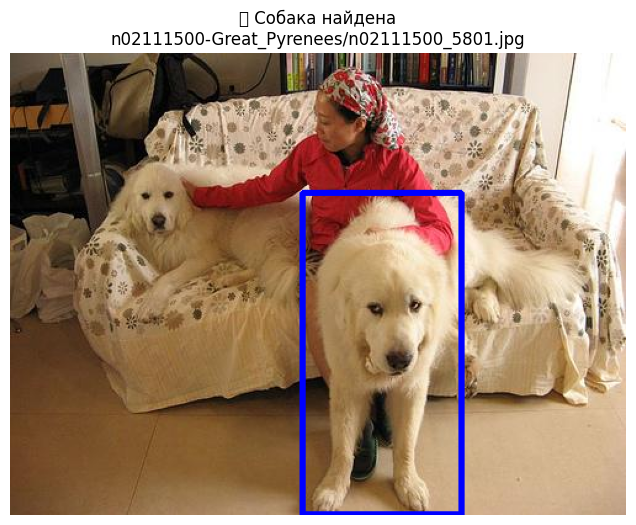

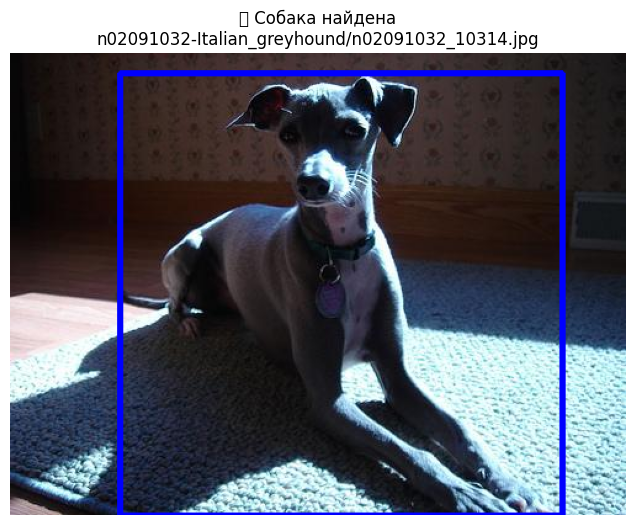

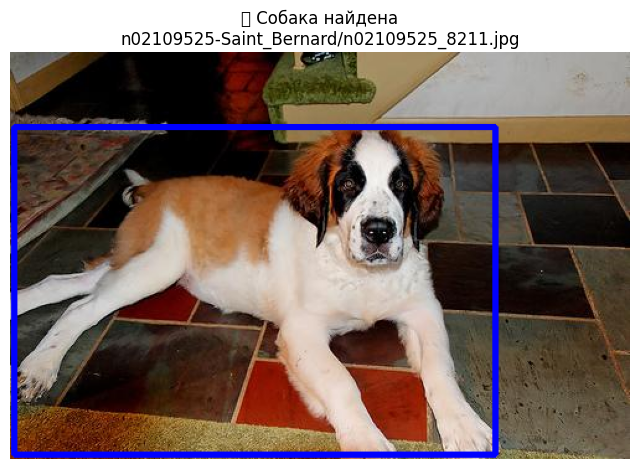

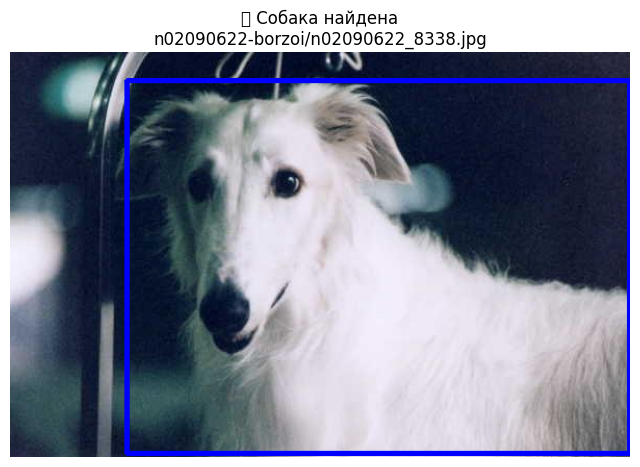

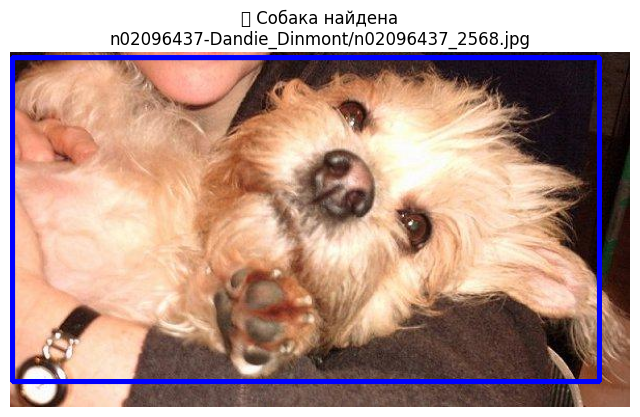

In [29]:
print("\n🔍 Примеры успешной детекции:")

for ex in found_examples[:5]:
    img_path = ex["path"]
    bbox = ex["best_box"]

    show_image_with_bbox(img_path, bbox)


⚠️ Примеры, где собака НЕ найдена:


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


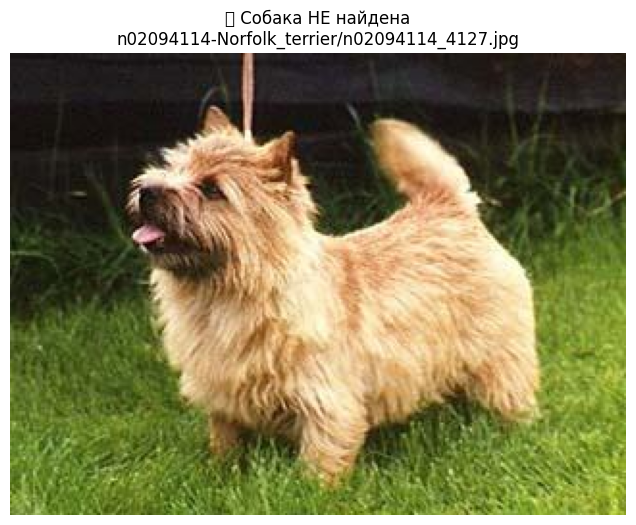

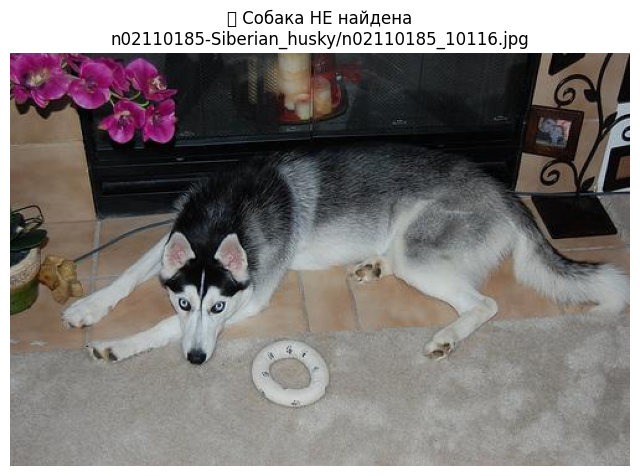

In [27]:
print("\n⚠️ Примеры, где собака НЕ найдена:")

for ex in not_found_examples:
    img_path = ex["path"]
    bbox = ex["best_box"]

    show_image_with_bbox(img_path, bbox)

# Обрезка изображений

## Тест обрезки изображений

In [14]:
from PIL import Image
import matplotlib.pyplot as plt

def crop_and_show(img_path, bbox):
    """
    Обрезает изображение по bbox и показывает результат.
    """
    # Загружаем изображение
    img = Image.open(img_path).convert("RGB")

    # Обрезаем по bbox (x1, y1, x2, y2)
    cropped = img.crop(bbox)

    # Визуализация: оригинал + обрезанное
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Оригинал
    axes[0].imshow(img)
    axes[0].set_title("Оригинал")
    axes[0].axis('off')

    # Обрезанное
    axes[1].imshow(cropped)
    axes[1].set_title("Обрезанная область (только собака)")
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()

    return cropped


🔍 Примеры успешной детекции и обрезки:


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


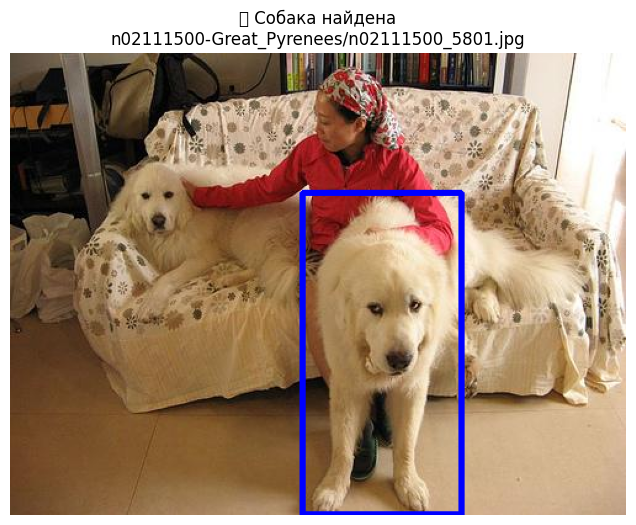

📷 Обрезка для: n02111500_5801.jpg


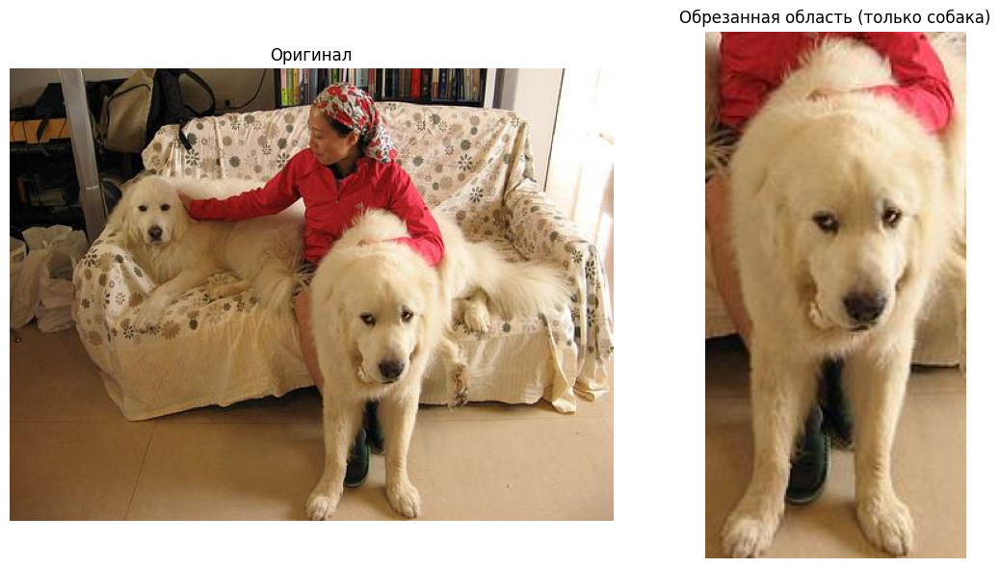

--------------------------------------------------


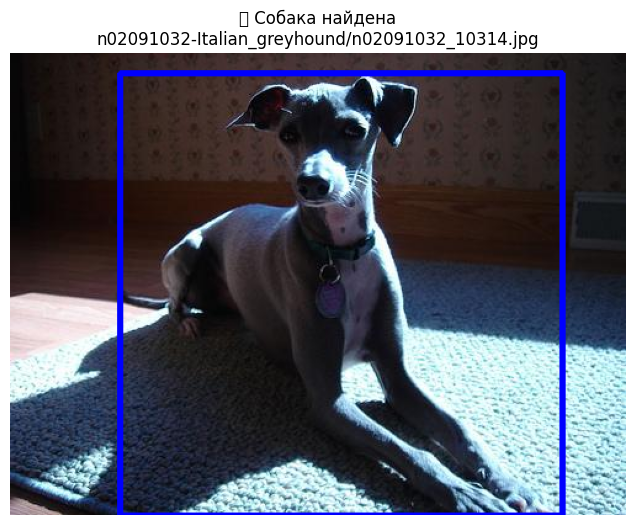

📷 Обрезка для: n02091032_10314.jpg


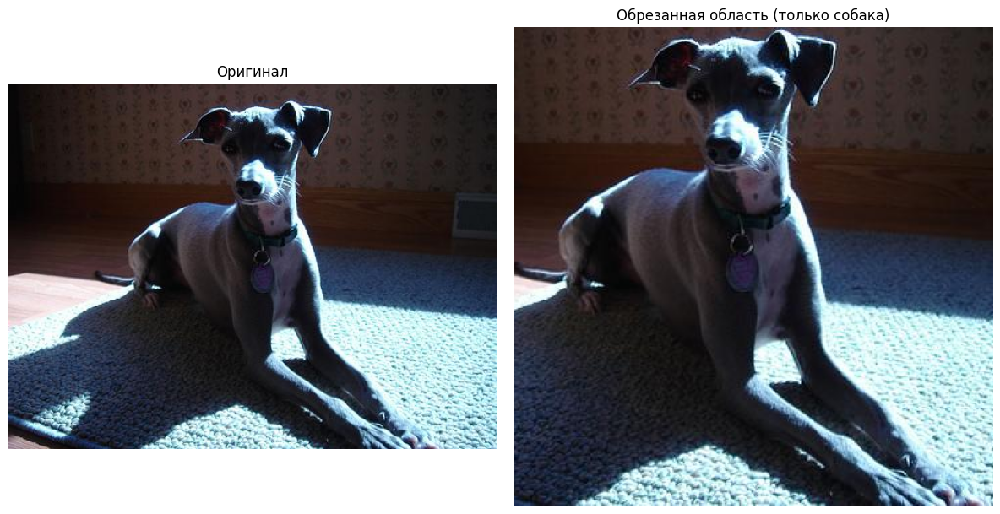

--------------------------------------------------


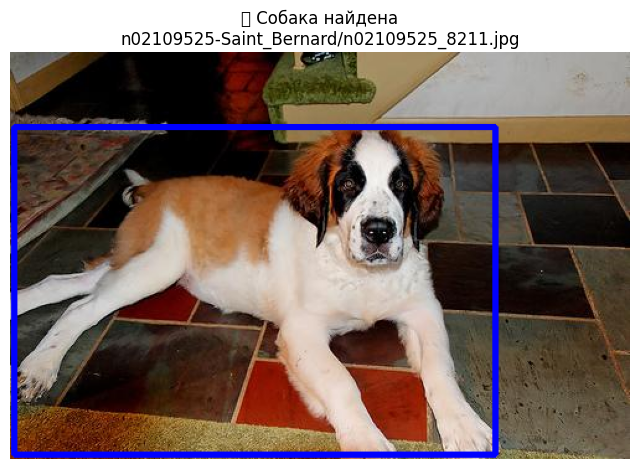

📷 Обрезка для: n02109525_8211.jpg


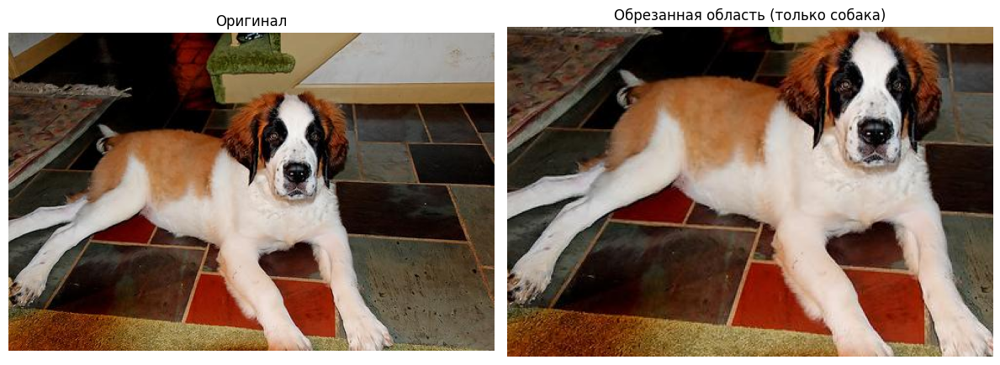

--------------------------------------------------


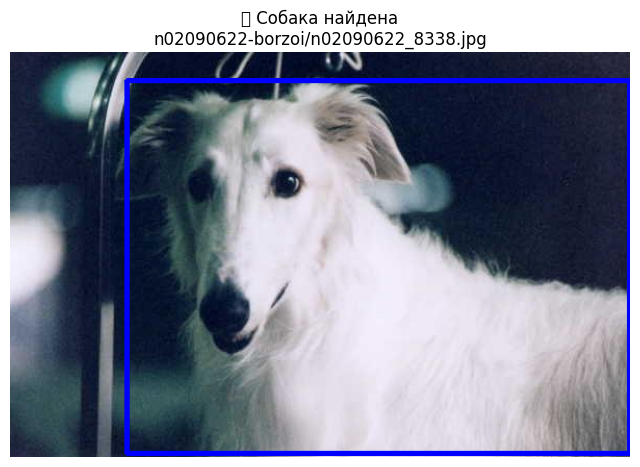

📷 Обрезка для: n02090622_8338.jpg


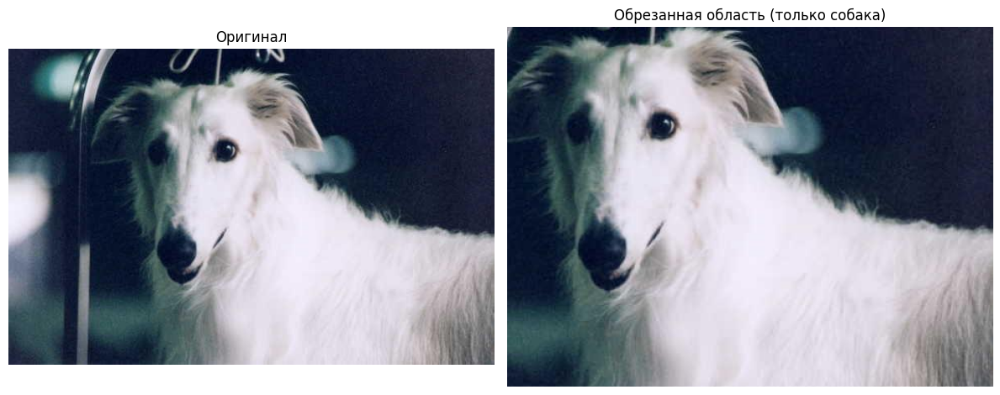

--------------------------------------------------


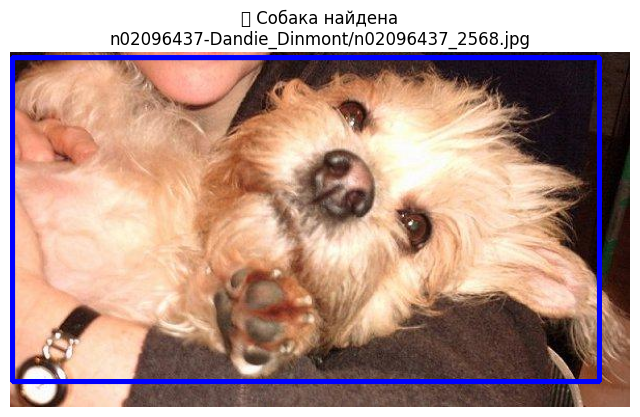

📷 Обрезка для: n02096437_2568.jpg


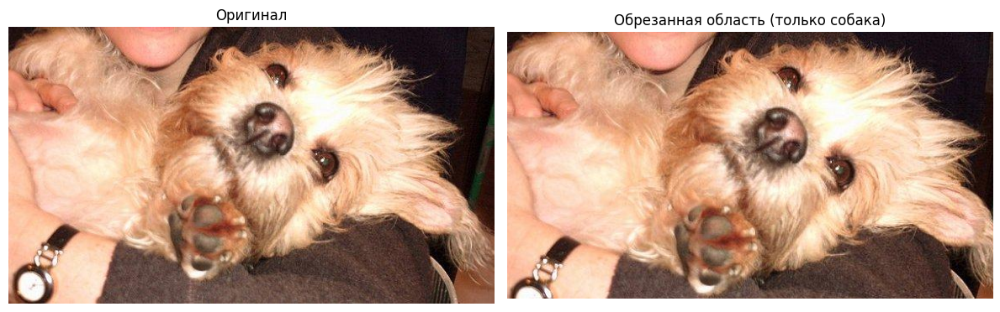

--------------------------------------------------


In [28]:
print("\n🔍 Примеры успешной детекции и обрезки:")

for ex in found_examples[:5]:
    img_path = ex["path"]
    bbox = ex["best_box"]

    # Сначала покажем оригинал с bbox (как раньше)
    show_image_with_bbox(img_path, bbox)

    # Теперь обрежем и покажем результат
    print(f"📷 Обрезка для: {img_path.name}")
    cropped_img = crop_and_show(str(img_path), bbox)

    print("-" * 50)

## Обрезка всего датасета

In [8]:
# Обрезка всего датасета Stanford Dogs
import os
import xml.etree.ElementTree as ET
from PIL import Image

def crop_all_dogs(input_dir="Images", ann_dir="Annotation", output_dir="CroppedImages"):
    os.makedirs(output_dir, exist_ok=True)
    for breed in os.listdir(ann_dir):
        os.makedirs(os.path.join(output_dir, breed), exist_ok=True)
        for xml_file in os.listdir(os.path.join(ann_dir, breed)):
            img_path = os.path.join(input_dir, breed, xml_file + ".jpg")
            out_path = os.path.join(output_dir, breed, xml_file + ".jpg")
            if not os.path.exists(img_path):
                continue
            # Читаем bbox
            tree = ET.parse(os.path.join(ann_dir, breed, xml_file))
            root = tree.getroot()
            obj = root.find('object')
            if obj is None: continue
            bndbox = obj.find('bndbox')
            if bndbox is None: continue
            xmin = int(bndbox.find('xmin').text)
            ymin = int(bndbox.find('ymin').text)
            xmax = int(bndbox.find('xmax').text)
            ymax = int(bndbox.find('ymax').text)
            # Обрезаем
            try:
                img = Image.open(img_path).convert("RGB")
                cropped = img.crop((xmin, ymin, xmax, ymax))
                cropped.save(out_path)
            except Exception as e:
                print(f"Ошибка: {img_path} — {e}")

crop_all_dogs()
print("✅ Обрезка завершена!")

✅ Обрезка завершена!


# Классификация

In [9]:
import torch
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader, random_split
from torchvision.datasets import ImageFolder
import torch.nn as nn
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
import numpy as np
import pickle
import os

# === 1. Устройство ===
device = torch.device("cpu")
print(f"Используем: {device}")

# === 2. Трансформации ===
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# === 3. Загрузка всего датасета ===
full_dataset = ImageFolder("CroppedImages", transform=transform)

# === 4. Разделение на train / val (90% / 10%) ===
train_size = int(0.9 * len(full_dataset))
val_size = len(full_dataset) - train_size
train_dataset, val_dataset = random_split(
    full_dataset,
    [train_size, val_size],
    generator=torch.Generator().manual_seed(42)
)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

print(f"Обучающих примеров: {train_size}")
print(f"Валидационных примеров: {val_size}")

# === 5. Загружаем ResNet18 как замороженный экстрактор ===
backbone = torchvision.models.resnet18(weights='IMAGENET1K_V1')
backbone.fc = nn.Identity()
backbone = backbone.to(device)
backbone.eval()

# === 6. Извлечение признаков для train и val ===
def extract_features(loader, backbone, device):
    features = []
    labels = []
    with torch.no_grad():
        for i, (images, targets) in enumerate(loader):
            images = images.to(device)
            feats = backbone(images)
            features.append(feats.cpu().numpy())
            labels.append(targets.numpy())
    return np.vstack(features), np.concatenate(labels)

print("Извлекаем признаки для обучения...")
X_train, y_train = extract_features(train_loader, backbone, device)

print("Извлекаем признаки для валидации...")
X_val, y_val = extract_features(val_loader, backbone, device)

# === 7. Обучение с валидацией и сохранением лучшей модели ===
print("Обучаем классификатор с валидацией...")

# Пробуем несколько значений C (регуляризация)
C_values = [0.01, 0.1, 1.0, 10.0]
best_acc = 0.0
best_model = None
best_C = None

for C in C_values:
    print(f"\nПробуем C = {C}")
    clf = LogisticRegression(max_iter=1000, C=C, random_state=42, solver='lbfgs')
    clf.fit(X_train, y_train)

    # Оценка на валидации
    val_preds = clf.predict(X_val)
    acc = accuracy_score(y_val, val_preds)
    print(f"  Точность на валидации: {acc:.4f}")

    if acc > best_acc:
        best_acc = acc
        best_model = clf
        best_C = C

print(f"\nЛучший результат: C={best_C}, точность={best_acc:.4f}")

# === 8. Сохраняем лучшую модель ===
output_dir = "saved_models"
os.makedirs(output_dir, exist_ok=True)

model_path = os.path.join(output_dir, "breed_classifier_best.pkl")
with open(model_path, "wb") as f:
    pickle.dump({
        "classifier": best_model,
        "class_names": full_dataset.classes,
        "val_accuracy": best_acc,
        "C": best_C
    }, f)

# Также сохраняем backbone (на случай, если захотите использовать позже)
torch.save(backbone.state_dict(), os.path.join(output_dir, "resnet18_backbone.pth"))

print(f"✅ Лучшая модель сохранена: {model_path}")

Используем: cpu
Обучающих примеров: 18522
Валидационных примеров: 2058
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 161MB/s]


Извлекаем признаки для обучения...
Извлекаем признаки для валидации...
Обучаем классификатор с валидацией...

Пробуем C = 0.01
  Точность на валидации: 0.8343

Пробуем C = 0.1
  Точность на валидации: 0.8265

Пробуем C = 1.0
  Точность на валидации: 0.8076

Пробуем C = 10.0
  Точность на валидации: 0.7979

Лучший результат: C=0.01, точность=0.8343
✅ Лучшая модель сохранена: saved_models/breed_classifier_best.pkl


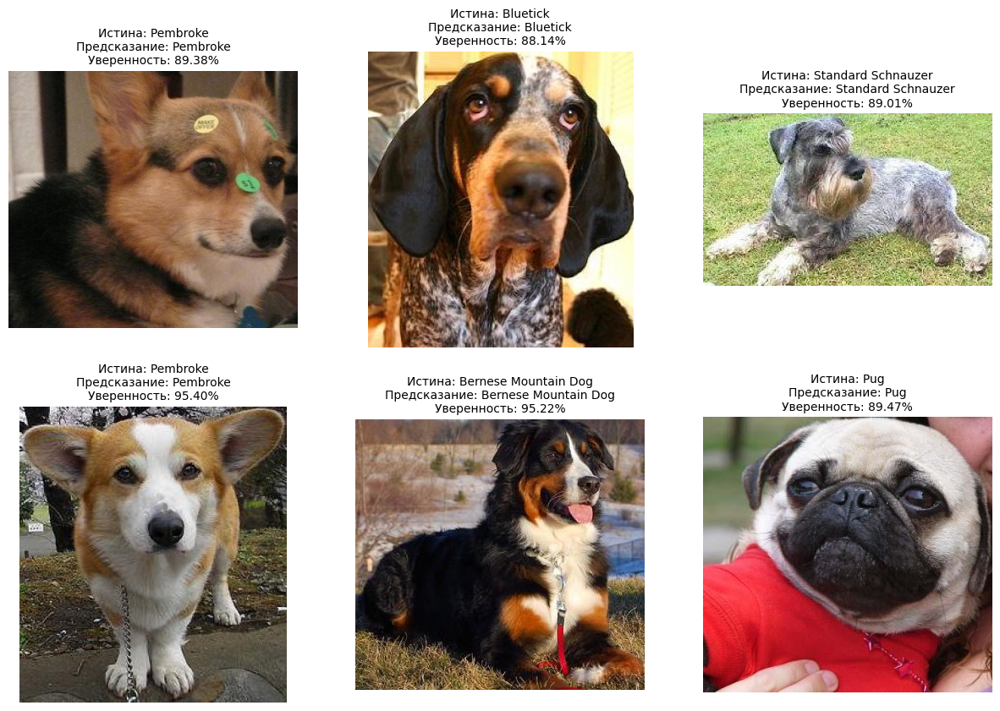

In [12]:
import os
import random
from pathlib import Path
import torch
import torchvision
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
import pickle

# === 1. Загрузка модели ===
device = torch.device("cpu")

# Загружаем backbone
backbone = torchvision.models.resnet18()
backbone.fc = torch.nn.Identity()
backbone.load_state_dict(torch.load("saved_models/resnet18_backbone.pth", map_location=device))
backbone.eval()
backbone.to(device)

# Загружаем классификатор
with open("saved_models/breed_classifier_best.pkl", "rb") as f:
    data = pickle.load(f)
    classifier = data["classifier"]
    class_names = data["class_names"]

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# === 2. Выбираем случайные изображения ===
dataset_root = Path("CroppedImages")  # или любая другая папка с обрезанными фото
all_images = list(dataset_root.rglob("*.jpg"))
random.seed(11)
test_images = random.sample(all_images, min(6, len(all_images)))

# === 3. Визуализация ===
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

for idx, img_path in enumerate(test_images):
    # Истинная порода (из пути)
    true_breed = img_path.parent.name.split("-", 1)[-1].replace("_", " ").title()

    # Загружаем и предобрабатываем
    img = Image.open(img_path).convert("RGB")
    img_t = transform(img).unsqueeze(0).to(device)

    # Предсказание
    with torch.no_grad():
        feats = backbone(img_t).cpu().numpy()
    pred_proba = classifier.predict_proba(feats)[0]
    pred_idx = classifier.predict(feats)[0]
    pred_breed = class_names[pred_idx].split("-", 1)[-1].replace("_", " ").title()
    confidence = pred_proba[pred_idx]

    # Отображение
    axes[idx].imshow(img)
    axes[idx].set_title(
        f"Истина: {true_breed}\n"
        f"Предсказание: {pred_breed}\n"
        f"Уверенность: {confidence:.2%}",
        fontsize=10
    )
    axes[idx].axis('off')

# # Скрыть пустые subplot'ы (если изображений < 6)
# for idx in range(len(test_images), 6):
#     axes[idx].axis('off')

# plt.tight_layout()
# plt.savefig("prediction_examples.jpg", dpi=150, bbox_inches='tight')
# plt.show()

# print("✅ Результаты сохранены в prediction_examples.jpg")